In [9]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sqlalchemy import create_engine
import MySQLdb
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.neural_network import MLPClassifier
from statsmodels.discrete.discrete_model import Logit, MNLogit
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, StratifiedKFold
import statsmodels.api as st
from imblearn.under_sampling import ClusterCentroids
import numpy as np
import scikitplot as skplt
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_columns', 50)

In [10]:
# import data
# feature engineering?
# k fold
# hyperparameter tuning
# Hospital Insurance -> classification
# Hospital Utilisation -> classification
# performance measure

In [11]:
# DB Connection
myvars = {}
with open("../risaac-mysql-password") as myfile:
    for line in myfile:
        name, var = line.partition(":")[::2]
        myvars[name.strip()] = var.strip()
        
myvars['DB databasename'] = 'I501saptpurkFall22grp_06_db'

conn = MySQLdb.connect(host="localhost", user=myvars['DB username'], passwd=myvars['DB password'], db=myvars['DB databasename'])
cursor = conn.cursor()

In [12]:
# df = pd.read_sql('select * from P_DEMO_HUQ_HIQ', conn)
# df = pd.read_csv("P_DEMO_HUQ_HIQ.csv")

In [13]:
# remove INDFMPIR and replace with INDFMPIR_imputed
df = df.drop("INDFMPIR", axis = 1)
df = df[~df.isna().any(axis = 1)]
df = df.rename(columns = {"INDFMPIR_imputed":"INDFMPIR"})

# copy dataframe
df_temp = df.copy()

In [14]:
# segragating features into nominal, ordinal and numeric
nominal_cols = [
    "RIAGENDR"
    ,"RIDRETH3"
    ,"DMDBORN4"
    ,"DMDMARTZ"
    ,"RIDEXPRG"
    ,"SIALANG"
    ,"SIAPROXY"
    ,"SIAINTRP"
    ,"HUQ030"
    ,"HUQ071"
    ,"HUQ090"
    ,"HIQ011"
    ,'HIQ032A'
    ,'HIQ032B'
    ,'HIQ032C'
    ,'HIQ032D'
    ,'HIQ032E'
    ,'HIQ032H'
    ,'HIQ032I'
    ,'HIQ270'
    ,'HIQ210'
]

ordinal_cols = [
    "DMDYRUSZ"
    ,"DMDEDUC2"
    ,"HUQ010"
    ,"HUQ051"
]

numeric_cols = [
    "RIDAGEYR"
    ,"RIDAGEMN"
    ,"INDFMPIR"
]

In [15]:
ordinal_cols_wo_Target = ordinal_cols = [
    "DMDYRUSZ"
    ,"DMDEDUC2"
    ,"HUQ010"
]

In [16]:
# columns to one hot encode
# RIDRETH3
# RIDRETH1
# DMDBORN4 - Encode to 0,1
# DMDMARTZ
# RIDEXPRG
# SIALANG - Encode to 0,1
# SIAPROXY - Encode to 0,1
# SIAINTRP - Encode to 0,1

# HUQ030
# HUQ071 - Encode to 0,1
# HUQ090 - Encode to 0,1
# HIQ011 - Encode to 0,1
# HIQ032A - Encode to 0,1

# HIQ270
# HIQ210

In [17]:
# covert 1=>0, 2=>1
enc_1_0_cols = ["DMDBORN4"
               ,"SIALANG"
               ,"HIQ032A"]
for col in enc_1_0_cols:
    df[col] = np.where(df[col] == 1, 0, 1)
    
# covert 1=>1, 2=>0
enc_1_0_cols = ["SIAPROXY"
               ,"SIAINTRP"
               ,"HUQ071"
               ,"HUQ090"
               ,"HIQ011"
               ,"HIQ032A"]
for col in enc_1_0_cols:
    df[col] = np.where(df[col] == 1, 1, 0)


In [18]:
one_hot_enc_cols = ["RIDRETH3"
                   ,"DMDMARTZ"
                   ,"RIDEXPRG"
                   ,"HUQ030"
                   ,"HIQ270"
                   ,"HIQ210"]

In [19]:
df[["HUQ051","HUQ030","HUQ010","HIQ210","HIQ270"]] = df[["HUQ051","HUQ030","HUQ010","HIQ210","HIQ270"]].astype("Int32")

In [20]:
demo_cols = [
    "RIAGENDR"
    ,"RIDAGEMN"
    ,"RIDRETH1"
    ,"RIDRETH3"
    ,"DMDBORN4"
    ,"DMDMARTZ"
    ,"RIDEXPRG"
    ,"SIALANG"
    ,"SIAPROXY"
    ,"SIAINTRP"
    ,"DMDYRUSZ"
    ,"DMDEDUC2"
    ,"INDFMPIR"
]

huq_cols = ["HUQ010"
           ,"HUQ071"
           ,"HUQ090"
           ,"HUQ051"]

hiq_cols = ["HIQ011"
    ,'HIQ032A'
    ,'HIQ032B'
    ,'HIQ032C'
    ,'HIQ032D'
    ,'HIQ032E'
    ,'HIQ032H'
    ,'HIQ032I'
    ,'HIQ270'
    ,'HIQ210']

### Hospital Utilisation Prediction Using Demographics & Health Insurance

In [21]:
target_col = "HUQ051"

In [22]:
output_df = pd.DataFrame()

In [23]:
# convert hospital utilisation to three class
df.loc[df["HUQ051"].isin([0,1,2]), "HUQ051"] = 0 # low utilisation
df.loc[df["HUQ051"].isin([3,4,5]), "HUQ051"] = 1 # moderate utilisation
# df.loc[df["HUQ051"].isin([4,5]), "HUQ051"] = 2 # high utilisation
df.loc[df["HUQ051"] >= 6, "HUQ051"] = 2 # high utilisation

In [24]:
df_dum = pd.get_dummies(df[demo_cols + hiq_cols + huq_cols], columns = [col for col in one_hot_enc_cols if col in demo_cols + huq_cols + hiq_cols], drop_first = True)

In [25]:
# df_dum = st.add_constant(df_dum, prepend = False)

In [26]:
X_train, X_test, y_train, y_test = train_test_split(df_dum[df_dum.columns[df_dum.columns != target_col]], 
                                                    df_dum[target_col], 
                                                    test_size=0.20
                                                    )

In [27]:
for col in X_train.columns:
    X_train[col] = X_train[col].astype(float)
    
for col in X_test.columns:
    X_test[col] = X_test[col].astype(float)

In [28]:
y_train = y_train.astype(int)

In [29]:
sm = SMOTE()

In [30]:
X_train, y_train = sm.fit_resample(X_train, y_train)

### Logistic Regression

In [51]:
# based on statsmodel multinomial logit
mdl = st.MNLogit(y_train, X_train)
mdl_fit = mdl.fit()
print(mdl_fit.summary())

Optimization terminated successfully.
         Current function value: 0.928456
         Iterations 6
                          MNLogit Regression Results                          
Dep. Variable:                 HUQ051   No. Observations:                23865
Model:                        MNLogit   Df Residuals:                    23795
Method:                           MLE   Df Model:                           68
Date:                Mon, 12 Dec 2022   Pseudo R-squ.:                  0.1549
Time:                        22:21:55   Log-Likelihood:                -22158.
converged:                       True   LL-Null:                       -26218.
Covariance Type:            nonrobust   LLR p-value:                     0.000
  HUQ051=1       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
RIAGENDR       0.2700      0.042      6.427      0.000       0.188       0.352
RIDAGEMN      -0.0003      0.

In [52]:
# filter significant columns based on p value
out = mdl_fit.summary()
out = out.tables[1].as_html()
out = pd.read_html(out, header=0, index_col=0)[0]

In [54]:
# separate both static tables
out1 = out.iloc[:36]
out2 = out.iloc[36:]
out2.columns = out2.iloc[0]
out2 = out2.iloc[1:]

In [58]:
out = pd.DataFrame({"HUQ051=1":out1['P>|z|'], "HUQ051=2":out2['P>|z|']})

In [59]:
out = out.astype(float)

In [60]:
out["HUQ051=1"][out["HUQ051=1"] > 0.1], out["HUQ051=2"][out["HUQ051=2"] > 0.1]

(HUQ051=1
 RIDAGEMN      0.195
 SIALANG       0.756
 SIAINTRP      0.253
 DMDEDUC2      0.124
 HIQ032E       0.528
 DMDMARTZ_2    0.360
 HIQ270_3      1.000
 HIQ210_3      1.000
 Name: HUQ051=1, dtype: float64,
 HUQ051=1
 HIQ032A       0.163
 HIQ032C       0.833
 DMDMARTZ_2    0.416
 HIQ270_3      1.000
 HIQ210_2      0.140
 HIQ210_3      1.000
 Name: HUQ051=2, dtype: float64)

In [61]:
new_cols = out[(out["HUQ051=1"] > 0.1) | (out["HUQ051=2"] > 0.1)].index.tolist()

In [62]:
new_cols

['RIDAGEMN',
 'SIALANG',
 'SIAINTRP',
 'DMDEDUC2',
 'HIQ032A',
 'HIQ032C',
 'HIQ032E',
 'DMDMARTZ_2',
 'HIQ270_3',
 'HIQ210_2',
 'HIQ210_3']

In [112]:
# based on statsmodel multinomial logit
mdl = st.MNLogit(y_train, X_train)
mdl_fit = mdl.fit()
print(mdl_fit.summary())

Optimization terminated successfully.
         Current function value: 0.928456
         Iterations 6
                          MNLogit Regression Results                          
Dep. Variable:                 HUQ051   No. Observations:                23865
Model:                        MNLogit   Df Residuals:                    23795
Method:                           MLE   Df Model:                           68
Date:                Mon, 12 Dec 2022   Pseudo R-squ.:                  0.1549
Time:                        22:44:56   Log-Likelihood:                -22158.
converged:                       True   LL-Null:                       -26218.
Covariance Type:            nonrobust   LLR p-value:                     0.000
  HUQ051=1       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
RIAGENDR       0.2700      0.042      6.427      0.000       0.188       0.352
RIDAGEMN      -0.0003      0.

In [113]:
model = LogisticRegression()

In [133]:
grid_vals = {'penalty': ['l2'], 'C': [0.01,0.1], 'max_iter':[100, 150, 200, 300], 'solver':['newton-cg', 'lbfgs', 'saga']}
# grid_vals = {'penalty': ['l2'], 'C': [0.001,0.01,0.1,1]}
grid_lr = GridSearchCV(estimator=model, param_grid=grid_vals, scoring='roc_auc_ovr',
                       cv=3, refit=True, return_train_score=True, error_score='raise', n_jobs=4) 

In [134]:
y_train = y_train.astype("float")

In [135]:
grid_lr.fit(X_train, y_train)

/home/jupyter-risaac/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jupyter-risaac/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

GridSearchCV(cv=3, error_score='raise', estimator=LogisticRegression(),
             n_jobs=4,
             param_grid={'C': [0.01, 0.1], 'max_iter': [100, 150, 200, 300],
                         'penalty': ['l2'],
                         'solver': ['newton-cg', 'lbfgs', 'saga']},
             return_train_score=True, scoring='roc_auc_ovr')

In [136]:
pd.DataFrame(grid_lr.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_max_iter,param_penalty,param_solver,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,1.107165,0.045080,0.006754,0.000964,0.01,100,l2,newton-cg,"{'C': 0.01, 'max_iter': 100, 'penalty': 'l2', ...",0.709768,0.732995,0.723486,0.722083,0.009534,5,0.730836,0.720337,0.725326,0.725500,0.004288
1,0.244430,0.003249,0.009032,0.000264,0.01,100,l2,lbfgs,"{'C': 0.01, 'max_iter': 100, 'penalty': 'l2', ...",0.675688,0.714739,0.695068,0.695165,0.015943,16,0.690844,0.703901,0.698980,0.697908,0.005384
2,0.860500,0.069800,0.007589,0.001200,0.01,100,l2,saga,"{'C': 0.01, 'max_iter': 100, 'penalty': 'l2', ...",0.656958,0.665021,0.663148,0.661709,0.003446,24,0.666872,0.659907,0.663905,0.663561,0.002854
3,0.964005,0.093566,0.007442,0.001161,0.01,150,l2,newton-cg,"{'C': 0.01, 'max_iter': 150, 'penalty': 'l2', ...",0.709768,0.732995,0.723486,0.722083,0.009534,5,0.730836,0.720337,0.725326,0.725500,0.004288
4,0.351022,0.012673,0.008780,0.000316,0.01,150,l2,lbfgs,"{'C': 0.01, 'max_iter': 150, 'penalty': 'l2', ...",0.694306,0.720505,0.709155,0.707989,0.010727,14,0.713224,0.708138,0.709716,0.710359,0.002126
5,1.292426,0.063727,0.007134,0.001322,0.01,150,l2,saga,"{'C': 0.01, 'max_iter': 150, 'penalty': 'l2', ...",0.667350,0.678778,0.674882,0.673670,0.004743,22,0.679176,0.671744,0.676365,0.675762,0.003064
6,0.914658,0.133737,0.007577,0.001149,0.01,200,l2,newton-cg,"{'C': 0.01, 'max_iter': 200, 'penalty': 'l2', ...",0.709768,0.732995,0.723486,0.722083,0.009534,5,0.730836,0.720337,0.725326,0.725500,0.004288
7,0.437043,0.037002,0.007946,0.001454,0.01,200,l2,lbfgs,"{'C': 0.01, 'max_iter': 200, 'penalty': 'l2', ...",0.695099,0.722664,0.709466,0.709076,0.011257,13,0.713511,0.712060,0.710503,0.712025,0.001228
8,1.713161,0.028361,0.007605,0.000897,0.01,200,l2,saga,"{'C': 0.01, 'max_iter': 200, 'penalty': 'l2', ...",0.674511,0.688225,0.682987,0.681908,0.005651,20,0.687626,0.679888,0.684821,0.684112,0.003199
9,0.891271,0.171662,0.006688,0.001187,0.01,300,l2,newton-cg,"{'C': 0.01, 'max_iter': 300, 'penalty': 'l2', ...",0.709768,0.732995,0.723486,0.722083,0.009534,5,0.730836,0.720337,0.725326,0.725500,0.004288


In [137]:
grid_lr.best_estimator_

LogisticRegression(C=0.1, solver='newton-cg')

In [138]:
y_pred = grid_lr.predict(X_test)
out = pd.DataFrame({"y_pred":y_pred, "y_label":y_test})

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

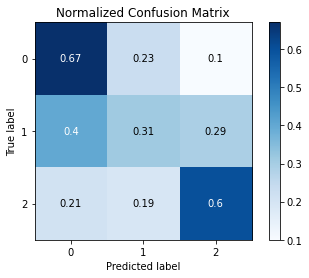

In [139]:
skplt.metrics.plot_confusion_matrix(out["y_label"].tolist(), out["y_pred"].tolist(), normalize=True)

In [140]:
print(classification_report(out["y_label"].tolist(), out["y_pred"].tolist(), target_names=["Low", "Moderate", "High"]))

              precision    recall  f1-score   support

         Low       0.80      0.67      0.73      2019
    Moderate       0.31      0.31      0.31       739
        High       0.25      0.60      0.35       242

    accuracy                           0.57      3000
   macro avg       0.45      0.52      0.46      3000
weighted avg       0.63      0.57      0.59      3000



In [141]:
y_pred = grid_lr.predict_proba(X_test)

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

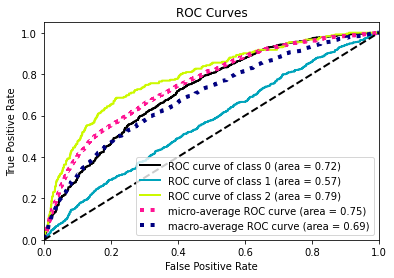

In [142]:
skplt.metrics.plot_roc(y_test.tolist(), y_pred)

### XGBoost

In [143]:
model = XGBClassifier()
grid_vals = {"n_estimators":[500,600,700], "learning_rate" : [0.1, 0.01], "max_depth" : [2,3,4], "subsample":[0.8,0.9],
                      "colsample_bytree":[0.8,0.9], 'reg_alpha':[1e-5, 1e-2]}

In [144]:
# grid_vals = {'penalty': ['l2'], 'C': [0.01,0.1], 'max_iter':[100, 150, 200, 300], 'solver':['newton-cg', 'lbfgs', 'saga']}
# grid_vals = {'penalty': ['l2'], 'C': [0.001,0.01,0.1,1]}
grid_lr = GridSearchCV(estimator=model, param_grid=grid_vals, scoring='roc_auc_ovr', 
                       cv=StratifiedKFold(n_splits=5), refit=True, return_train_score=True, error_score='raise', n_jobs=-1)

In [145]:
grid_lr.fit(X_train, y_train)
# grid_lr.fit(X_resampled, y_resampled)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise',
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_pol...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.8, 0.9],
                         'learning_rate': [0.1, 0.01], 'max_depth': [2, 3, 4],
                         'n_estimators': [500, 600, 700],
                         'reg_alpha': [1e-05, 0.01], 'subsample': [0.8, 0.9]},
             return_train_score=True, scoring='roc_auc_ovr')

In [146]:
pd.DataFrame(grid_lr.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_learning_rate,param_max_depth,param_n_estimators,param_reg_alpha,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,15.561511,0.333774,0.042028,0.000649,0.8,0.1,2,500,0.00001,0.8,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.746947,0.824244,0.909817,0.914473,0.910922,0.861280,0.066473,68,0.917152,0.895977,0.879575,0.879146,0.879802,0.890330,0.014852
1,15.349671,0.327866,0.042218,0.001120,0.8,0.1,2,500,0.00001,0.9,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.747889,0.824091,0.909631,0.913824,0.910163,0.861120,0.065922,72,0.916449,0.895229,0.878810,0.878345,0.879324,0.889631,0.014841
2,15.559781,0.312356,0.043535,0.001223,0.8,0.1,2,500,0.01,0.8,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.747170,0.823999,0.909921,0.914628,0.910767,0.861297,0.066441,67,0.916923,0.895932,0.879562,0.879326,0.879936,0.890336,0.014722
3,15.419096,0.376189,0.042781,0.000920,0.8,0.1,2,500,0.01,0.9,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.747792,0.823857,0.909372,0.913913,0.910722,0.861131,0.066042,71,0.916511,0.895160,0.878815,0.878418,0.879395,0.889660,0.014836
4,18.691671,0.378136,0.049118,0.000909,0.8,0.1,2,600,0.00001,0.8,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.748965,0.826045,0.913027,0.917430,0.914247,0.863943,0.067018,60,0.921545,0.900640,0.884392,0.883991,0.884400,0.894993,0.014714
5,18.464844,0.445585,0.048802,0.000171,0.8,0.1,2,600,0.00001,0.9,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.749292,0.825661,0.912659,0.917419,0.913513,0.863709,0.066784,64,0.920808,0.899801,0.883587,0.883055,0.883932,0.894237,0.014708
6,18.647433,0.386514,0.049081,0.001554,0.8,0.1,2,600,0.01,0.8,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.749334,0.825731,0.912997,0.917153,0.914006,0.863844,0.066842,62,0.921359,0.900588,0.884366,0.883991,0.884480,0.894957,0.014635
7,18.585889,0.419353,0.050004,0.001310,0.8,0.1,2,600,0.01,0.9,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.749283,0.825564,0.912471,0.917378,0.913979,0.863735,0.066833,63,0.920724,0.899634,0.883718,0.883099,0.883995,0.894234,0.014631
8,21.954187,0.443613,0.056649,0.002109,0.8,0.1,2,700,0.00001,0.8,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.750663,0.828089,0.914981,0.919646,0.916489,0.865974,0.067180,52,0.925170,0.904468,0.888127,0.888078,0.888435,0.898856,0.014586
9,21.788076,0.489859,0.056181,0.000483,0.8,0.1,2,700,0.00001,0.9,"{'colsample_bytree': 0.8, 'learning_rate': 0.1...",0.750975,0.827751,0.914692,0.919546,0.915904,0.865774,0.066966,55,0.924331,0.903715,0.887824,0.886907,0.887791,0.898114,0.014538


In [147]:
grid_lr.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.9,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=4, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=700, n_jobs=0,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto', ...)

In [148]:
y_pred = grid_lr.predict(X_test)
out = pd.DataFrame({"y_pred":y_pred, "y_label":y_test})

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

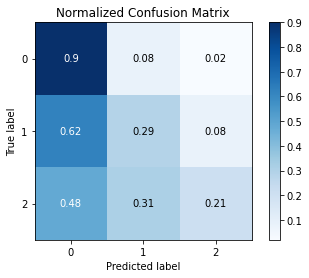

In [149]:
skplt.metrics.plot_confusion_matrix(out["y_label"].tolist(), out["y_pred"].tolist(), normalize=True)

In [150]:
print(classification_report(out["y_label"].tolist(), out["y_pred"].tolist(), target_names=["Low", "Moderate", "High"]))

              precision    recall  f1-score   support

         Low       0.76      0.90      0.82      2019
    Moderate       0.47      0.29      0.36       739
        High       0.35      0.21      0.27       242

    accuracy                           0.69      3000
   macro avg       0.53      0.47      0.48      3000
weighted avg       0.65      0.69      0.66      3000



In [151]:
y_pred = grid_lr.predict_proba(X_test)

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

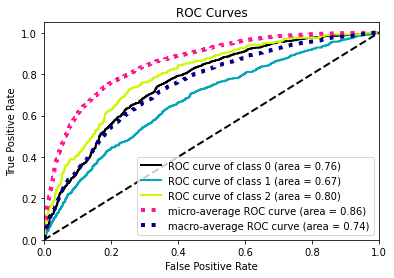

In [152]:
skplt.metrics.plot_roc(y_test.tolist(), y_pred)

Text(0, 0.5, 'Features')

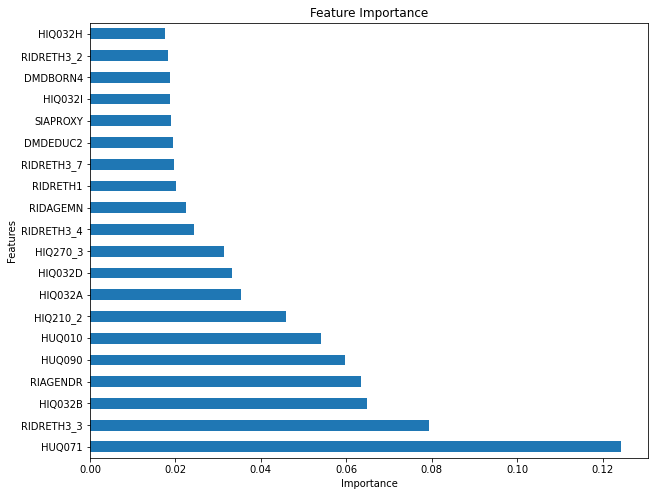

In [154]:
feat_importances = pd.Series(grid_lr.best_estimator_.feature_importances_, index=X_train.columns)
feat_importances.nlargest(20).plot(kind='barh', figsize=(10,8))
plt.title("Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Features")

### LightGBM

In [159]:
model = LGBMClassifier()

In [160]:
grid_vals = {'learning_rate': [0.01, 0.1], 'n_estimators': [100, 200, 300],
               'num_leaves': [6, 12, 16,24], 'boosting_type': ['gbdt', 'dart'], 
               'colsample_bytree': [0.65, 0.75, 0.8], 
               'subsample': [0.7, 0.75], 'reg_alpha': [1e-5, 1e-2],
               'reg_lambda': [1e-5, 1e-2]}

In [161]:
grid_lr = GridSearchCV(estimator=model, param_grid=grid_vals, scoring='roc_auc_ovr', 
                       cv=StratifiedKFold(n_splits=5), refit=True, return_train_score=True, error_score='raise', n_jobs=4) 

In [162]:
grid_lr.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise', estimator=LGBMClassifier(), n_jobs=4,
             param_grid={'boosting_type': ['gbdt', 'dart'],
                         'colsample_bytree': [0.65, 0.75, 0.8],
                         'learning_rate': [0.01, 0.1],
                         'n_estimators': [100, 200, 300],
                         'num_leaves': [6, 12, 16, 24],
                         'reg_alpha': [1e-05, 0.01],
                         'reg_lambda': [1e-05, 0.01],
                         'subsample': [0.7, 0.75]},
             return_train_score=True, scoring='f1_micro')

In [163]:
pd.DataFrame(grid_lr.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_boosting_type,param_colsample_bytree,param_learning_rate,param_n_estimators,param_num_leaves,param_reg_alpha,param_reg_lambda,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.265059,0.003797,0.014722,0.000905,gbdt,0.65,0.01,100,6,0.00001,0.00001,0.7,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",0.532789,0.610517,0.664991,0.650744,0.642573,0.620323,0.047274,1085,0.671800,0.651268,0.629426,0.627383,0.632621,0.642499,0.016926
1,0.267248,0.004561,0.016414,0.001449,gbdt,0.65,0.01,100,6,0.00001,0.00001,0.75,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",0.532789,0.610517,0.664991,0.650744,0.642573,0.620323,0.047274,1085,0.671800,0.651268,0.629426,0.627383,0.632621,0.642499,0.016926
2,0.268065,0.004292,0.016545,0.001313,gbdt,0.65,0.01,100,6,0.00001,0.01,0.7,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",0.532370,0.610517,0.664781,0.650744,0.642573,0.620197,0.047390,1089,0.671695,0.651268,0.629426,0.627331,0.632621,0.642468,0.016899
3,0.268045,0.002137,0.015992,0.001590,gbdt,0.65,0.01,100,6,0.00001,0.01,0.75,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",0.532370,0.610517,0.664781,0.650744,0.642573,0.620197,0.047390,1089,0.671695,0.651268,0.629426,0.627331,0.632621,0.642468,0.016899
4,0.266653,0.002661,0.015319,0.001280,gbdt,0.65,0.01,100,6,0.01,0.00001,0.7,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",0.532579,0.610517,0.664781,0.650325,0.642573,0.620155,0.047258,1091,0.672795,0.651791,0.629426,0.627226,0.632621,0.642772,0.017353
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1147,5.386084,0.092553,0.086168,0.002278,dart,0.8,0.1,300,24,0.00001,0.01,0.75,"{'boosting_type': 'dart', 'colsample_bytree': ...",0.507228,0.706893,0.821286,0.836162,0.829876,0.740289,0.125866,77,0.869893,0.837785,0.800492,0.802640,0.802221,0.822606,0.027458
1148,5.372093,0.103530,0.085514,0.001666,dart,0.8,0.1,300,24,0.01,0.00001,0.7,"{'boosting_type': 'dart', 'colsample_bytree': ...",0.512047,0.705845,0.820658,0.837000,0.831972,0.741504,0.124492,73,0.870469,0.837105,0.801226,0.803373,0.801592,0.822753,0.027458
1149,5.373224,0.107279,0.084819,0.002290,dart,0.8,0.1,300,24,0.01,0.00001,0.75,"{'boosting_type': 'dart', 'colsample_bytree': ...",0.512047,0.705845,0.820658,0.837000,0.831972,0.741504,0.124492,73,0.870469,0.837105,0.801226,0.803373,0.801592,0.822753,0.027458
1150,5.391153,0.083877,0.086064,0.003158,dart,0.8,0.1,300,24,0.01,0.01,0.7,"{'boosting_type': 'dart', 'colsample_bytree': ...",0.507647,0.707312,0.820658,0.833229,0.830086,0.739786,0.125195,79,0.869736,0.837052,0.800859,0.803006,0.803006,0.822732,0.027096


In [164]:
grid_lr.best_estimator_

LGBMClassifier(colsample_bytree=0.8, n_estimators=300, num_leaves=24,
               reg_alpha=1e-05, reg_lambda=1e-05, subsample=0.7)

In [165]:
y_pred = grid_lr.predict(X_test)
out = pd.DataFrame({"y_pred":y_pred.flatten(), "y_label":y_test})

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

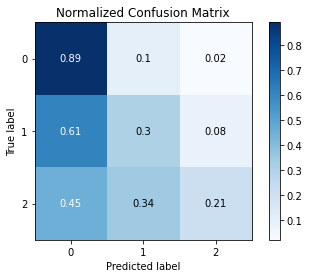

In [166]:
skplt.metrics.plot_confusion_matrix(out["y_label"].tolist(), out["y_pred"].tolist(), normalize=True)

In [167]:
print(classification_report(out["y_label"].tolist(), out["y_pred"].tolist(), target_names=["Low", "Moderate", "High"]))

              precision    recall  f1-score   support

         Low       0.76      0.89      0.82      2019
    Moderate       0.45      0.30      0.36       739
        High       0.36      0.21      0.27       242

    accuracy                           0.69      3000
   macro avg       0.52      0.47      0.48      3000
weighted avg       0.65      0.69      0.66      3000



In [168]:
y_pred = grid_lr.predict_proba(X_test)

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

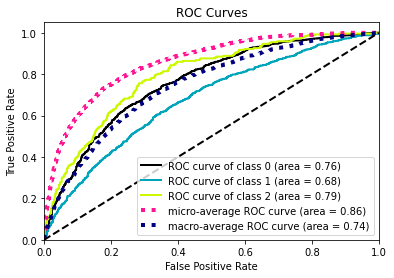

In [169]:
skplt.metrics.plot_roc(y_test.tolist(), y_pred)

Text(0, 0.5, 'Features')

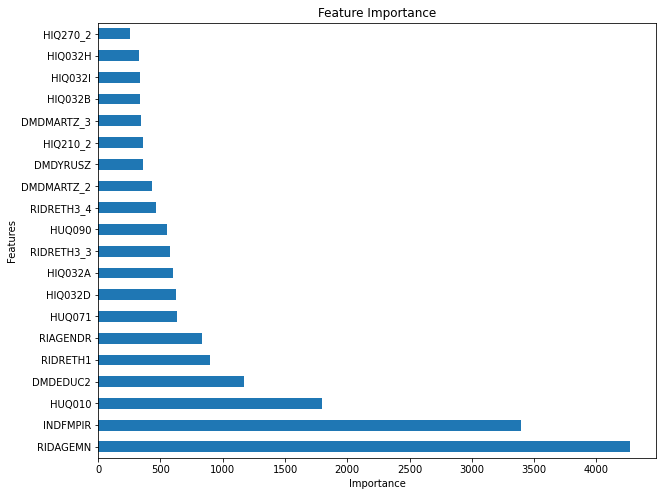

In [170]:
feat_importances = pd.Series(grid_lr.best_estimator_.feature_importances_, index=X_train.columns)
feat_importances.nlargest(20).plot(kind='barh', figsize=(10,8))
plt.title("Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Features")

### Random Forest Classifier

In [31]:
model = RandomForestClassifier()

In [32]:
grid_vals = {'n_estimators': [150, 200, 300],
             'criterion':['gini', 'entropy', 'log_loss'], 'max_depth': [2,4,6,8],
             'min_samples_split':[2,4], 'min_samples_leaf':[1,2],
             'max_features':[0.85,0.9,0.95]}

In [33]:
grid_lr = GridSearchCV(estimator=model, param_grid=grid_vals, scoring='roc_auc_ovr', 
                       cv=StratifiedKFold(n_splits=5), refit=True, return_train_score=True, error_score='raise', n_jobs=-1) 

In [34]:
y_train = y_train.astype(int)

In [35]:
grid_lr.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise', estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 4, 6, 8],
                         'max_features': [0.85, 0.9, 0.95],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 4],
                         'n_estimators': [150, 200, 300]},
             return_train_score=True, scoring='roc_auc_ovr')

In [36]:
pd.DataFrame(grid_lr.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.171959,0.077749,0.041640,0.000274,gini,2,0.85,1,2,150,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.706873,0.763485,0.742504,0.730382,0.736217,0.735892,0.018318,326,0.754938,0.746515,0.742778,0.724507,0.739916,0.741731,0.009984
1,2.887169,0.112964,0.053580,0.000443,gini,2,0.85,1,2,200,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.711059,0.763890,0.735345,0.724327,0.735747,0.734073,0.017425,329,0.760639,0.743873,0.735337,0.719739,0.738533,0.739624,0.013226
2,4.369424,0.171082,0.078911,0.001500,gini,2,0.85,1,2,300,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.709978,0.763576,0.724565,0.739731,0.726242,0.732819,0.018038,333,0.759305,0.744916,0.725027,0.734859,0.728547,0.738531,0.012393
3,2.177656,0.085087,0.041379,0.000366,gini,2,0.85,1,4,150,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.697551,0.762649,0.725343,0.730676,0.725115,0.728267,0.020736,343,0.747724,0.742481,0.726087,0.726249,0.725843,0.733677,0.009476
4,2.882438,0.123522,0.053496,0.000426,gini,2,0.85,1,4,200,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.708705,0.763253,0.726494,0.741003,0.734016,0.734694,0.017880,328,0.758065,0.745022,0.728342,0.736073,0.736900,0.740881,0.010086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427,14.154774,0.879365,0.083636,0.001260,log_loss,8,0.95,2,2,200,"{'criterion': 'log_loss', 'max_depth': 8, 'max...",0.759087,0.818981,0.886647,0.885804,0.881852,0.846474,0.050606,104,0.913204,0.897220,0.876886,0.879401,0.878510,0.889044,0.014159
428,21.196907,1.354356,0.122866,0.001837,log_loss,8,0.95,2,2,300,"{'criterion': 'log_loss', 'max_depth': 8, 'max...",0.759747,0.818576,0.887448,0.885965,0.882967,0.846941,0.050733,96,0.913838,0.896566,0.877954,0.880275,0.878996,0.889526,0.013935
429,10.602394,0.648088,0.064198,0.000941,log_loss,8,0.95,2,4,150,"{'criterion': 'log_loss', 'max_depth': 8, 'max...",0.761152,0.818123,0.886156,0.884827,0.882759,0.846603,0.049891,103,0.914189,0.897159,0.877091,0.879218,0.879157,0.889363,0.014386
430,13.657755,1.130992,0.073700,0.004444,log_loss,8,0.95,2,4,200,"{'criterion': 'log_loss', 'max_depth': 8, 'max...",0.761589,0.818097,0.886282,0.885078,0.882349,0.846679,0.049744,101,0.915271,0.896148,0.877011,0.879419,0.878948,0.889359,0.014678


In [37]:
grid_lr.best_estimator_

RandomForestClassifier(max_depth=8, max_features=0.85, n_estimators=200)

In [38]:
y_pred = grid_lr.predict(X_test)
out = pd.DataFrame({"y_pred":y_pred.flatten(), "y_label":y_test})

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

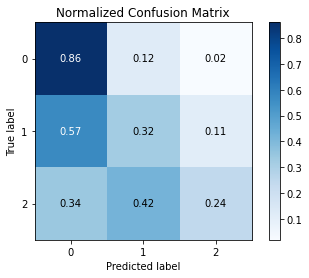

In [39]:
skplt.metrics.plot_confusion_matrix(out["y_label"].tolist(), out["y_pred"].tolist(), normalize=True)

In [40]:
print(classification_report(out["y_label"].tolist(), out["y_pred"].tolist(), target_names=["Low", "Moderate", "High"]))

              precision    recall  f1-score   support

         Low       0.77      0.86      0.81      2008
    Moderate       0.40      0.32      0.36       731
        High       0.34      0.24      0.28       261

    accuracy                           0.67      3000
   macro avg       0.50      0.47      0.48      3000
weighted avg       0.64      0.67      0.66      3000



In [41]:
y_pred = grid_lr.predict_proba(X_test)

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

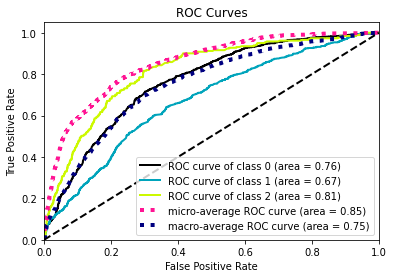

In [42]:
skplt.metrics.plot_roc(y_test.tolist(), y_pred)

Text(0, 0.5, 'Features')

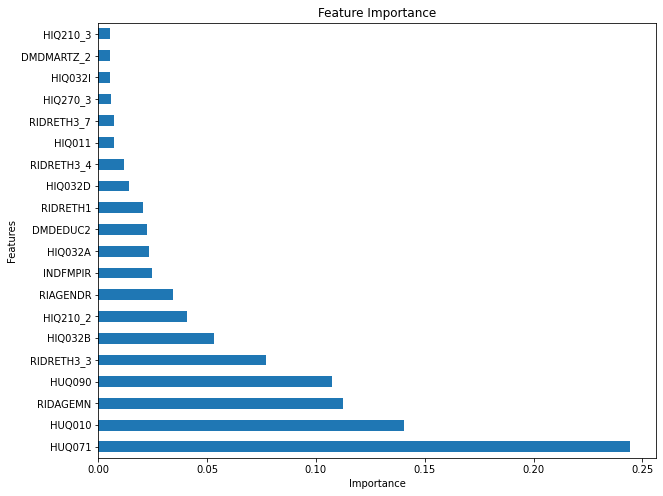

In [43]:
feat_importances = pd.Series(grid_lr.best_estimator_.feature_importances_, index=X_train.columns)
feat_importances.nlargest(20).plot(kind='barh', figsize=(10,8))
plt.title("Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Features")

### MLP

In [44]:
df

,SEQN,SDDSRVYR,RIDSTATR,RIAGENDR,RIDAGEYR,RIDAGEMN,RIDRETH1,RIDRETH3,DMDBORN4,DMDYRUSZ,DMDEDUC2,DMDMARTZ,RIDEXPRG,SIALANG,SIAPROXY,SIAINTRP,INDFMPIR,HUQ010,HUQ030,HUQ051,HUQ071,HUQ090,HIQ011,HIQ032A,HIQ032B,HIQ032C,HIQ032D,HIQ032E,HIQ032H,HIQ032I,HIQ270,HIQ210
0,109263,66,2,0,2,24,5,6,0,5,6,4,4,0,1,0,4.66,1,1,0,0,0,1,0,0,0,0,0,0,0,1,2
1,109264,66,2,1,13,156,1,1,0,5,6,4,4,0,1,0,0.83,2,1,0,0,1,1,1,0,0,0,0,1,0,1,2
2,109265,66,2,0,2,24,3,3,0,5,6,4,4,0,1,0,3.06,1,1,0,0,0,1,0,0,0,1,0,0,0,1,2
3,109266,66,2,1,29,348,5,6,1,2,5,3,2,0,0,0,5.00,3,1,0,0,0,1,0,0,0,0,0,0,0,1,2
4,109267,66,1,1,21,252,2,2,1,3,4,3,3,0,0,0,5.00,1,2,0,0,0,1,0,0,0,0,0,0,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15393,124818,66,2,0,40,480,4,4,0,5,5,1,4,0,0,0,3.82,2,1,0,0,0,1,0,0,0,0,0,0,0,1,2
15394,124819,66,2,0,2,24,4,4,0,5,6,4,4,0,1,0,0.07,3,1,1,0,0,1,1,0,0,1,0,0,0,1,2
15395,124820,66,2,1,7,84,3,3,0,5,6,4,4,0,1,0,1.22,1,1,0,0,0,1,1,0,0,1,0,0,0,1,2
15396,124821,66,2,0,63,756,4,4,0,5,2,2,4,0,0,0,3.71,3,1,0,0,0,0,1,0,0,0,0,0,0,3,3


In [45]:
X, y = df[df.columns[df.columns != target_col]], df[target_col]

In [46]:
X[numeric_cols + ordinal_cols] = MinMaxScaler().fit_transform(X[numeric_cols + ordinal_cols_wo_Target])

In [47]:
df_l = pd.concat([X, y], axis = 1)

In [48]:
df_dum = pd.get_dummies(df_l[demo_cols + hiq_cols + huq_cols], columns = [col for col in one_hot_enc_cols if col in demo_cols + huq_cols + hiq_cols], drop_first = True)

In [49]:
X_train, X_test, y_train, y_test = train_test_split(df_dum[df_dum.columns[df_dum.columns != target_col]], 
                                                    df_dum[target_col], 
                                                    test_size=0.20
                                                    )

In [50]:
for col in X_train.columns:
    X_train[col] = X_train[col].astype(float)
    
for col in X_test.columns:
    X_test[col] = X_test[col].astype(float)

In [51]:
model = MLPClassifier()

In [52]:
grid_vals = {'hidden_layer_sizes': [(50,), (100,), (150)],
             'activation':['relu', 'identity', 'logistic', 'tanh'],
             'solver':['lbfgs', 'sgd', 'adam'],
             'alpha':[0.001, 0.01],
             'learning_rate':['constant', 'adaptive'],
             'max_iter':[200, 300],
             'early_stopping':[True, False]}

In [53]:
grid_lr = GridSearchCV(estimator=model, param_grid=grid_vals, scoring='roc_auc_ovr', 
                       cv=StratifiedKFold(n_splits=5), refit=True, return_train_score=True, error_score='raise', n_jobs=-1) 

In [54]:
y_train = y_train.astype(int)

In [55]:
grid_lr.fit(X_train, y_train)

/home/jupyter-risaac/.local/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/jupyter-risaac/.local/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/jupyter-risaac/.local/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/jupyter-risaac/.local/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/jupyter-risaac/.local/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/jupyter-risaac/.local/lib/python3.

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise', estimator=MLPClassifier(), n_jobs=-1,
             param_grid={'activation': ['relu', 'identity', 'logistic', 'tanh'],
                         'alpha': [0.001, 0.01],
                         'early_stopping': [True, False],
                         'hidden_layer_sizes': [(50,), (100,), 150],
                         'learning_rate': ['constant', 'adaptive'],
                         'max_iter': [200, 300],
                         'solver': ['lbfgs', 'sgd', 'adam']},
             return_train_score=True, scoring='roc_auc_ovr')

In [56]:
pd.DataFrame(grid_lr.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_activation,param_alpha,param_early_stopping,param_hidden_layer_sizes,param_learning_rate,param_max_iter,param_solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,4.183093,0.082842,0.007632,0.001292,relu,0.001,True,"(50,)",constant,200,lbfgs,"{'activation': 'relu', 'alpha': 0.001, 'early_...",0.726992,0.714882,0.724349,0.727250,0.726426,0.723980,0.004662,104,0.786412,0.783530,0.788698,0.797101,0.792287,0.789606,0.004718
1,0.760977,0.270012,0.006831,0.000824,relu,0.001,True,"(50,)",constant,200,sgd,"{'activation': 'relu', 'alpha': 0.001, 'early_...",0.685802,0.518435,0.658242,0.688027,0.674378,0.644977,0.064145,539,0.705649,0.530124,0.661920,0.678237,0.680097,0.651205,0.062137
2,0.830440,0.359554,0.008669,0.002551,relu,0.001,True,"(50,)",constant,200,adam,"{'activation': 'relu', 'alpha': 0.001, 'early_...",0.707709,0.715305,0.727105,0.717310,0.721052,0.717696,0.006409,307,0.736372,0.745921,0.752305,0.719860,0.721593,0.735210,0.012879
3,6.859173,0.056292,0.008107,0.002100,relu,0.001,True,"(50,)",constant,300,lbfgs,"{'activation': 'relu', 'alpha': 0.001, 'early_...",0.715120,0.711435,0.709425,0.717555,0.717972,0.714301,0.003368,355,0.801231,0.810004,0.798909,0.805508,0.806791,0.804489,0.003963
4,1.281077,0.495496,0.008072,0.001433,relu,0.001,True,"(50,)",constant,300,sgd,"{'activation': 'relu', 'alpha': 0.001, 'early_...",0.690520,0.676923,0.691467,0.715692,0.644410,0.683803,0.023324,503,0.707194,0.689568,0.693424,0.706697,0.652190,0.689815,0.020079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
571,11.595784,0.702451,0.014283,0.000715,tanh,0.01,False,150,adaptive,200,sgd,"{'activation': 'tanh', 'alpha': 0.01, 'early_s...",0.708495,0.711015,0.722937,0.723424,0.725225,0.718219,0.006998,283,0.728311,0.728844,0.725098,0.722707,0.723574,0.725707,0.002471
572,12.853656,0.100628,0.015351,0.000528,tanh,0.01,False,150,adaptive,200,adam,"{'activation': 'tanh', 'alpha': 0.01, 'early_s...",0.732295,0.734147,0.733967,0.748340,0.739580,0.737666,0.005874,4,0.776778,0.778484,0.780704,0.775054,0.779189,0.778042,0.001956
573,20.367702,0.648725,0.011908,0.002958,tanh,0.01,False,150,adaptive,300,lbfgs,"{'activation': 'tanh', 'alpha': 0.01, 'early_s...",0.711906,0.710229,0.701064,0.719622,0.714855,0.711535,0.006130,391,0.810609,0.807275,0.807586,0.805173,0.809325,0.807993,0.001857
574,12.816022,1.013603,0.011985,0.003523,tanh,0.01,False,150,adaptive,300,sgd,"{'activation': 'tanh', 'alpha': 0.01, 'early_s...",0.709523,0.712071,0.721934,0.725016,0.725812,0.718871,0.006767,199,0.728218,0.727701,0.725041,0.723707,0.722898,0.725513,0.002118


In [57]:
grid_lr.best_estimator_

MLPClassifier(activation='logistic', alpha=0.001, early_stopping=True,
              hidden_layer_sizes=150, learning_rate='adaptive', max_iter=300,
              solver='lbfgs')

In [58]:
y_pred = grid_lr.predict(X_test)
out = pd.DataFrame({"y_pred":y_pred.flatten(), "y_label":y_test})

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

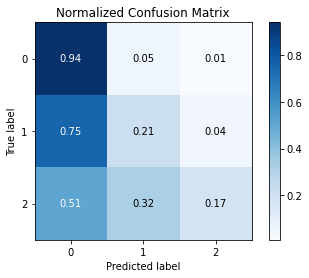

In [59]:
skplt.metrics.plot_confusion_matrix(out["y_label"].tolist(), out["y_pred"].tolist(), normalize=True)

In [60]:
print(classification_report(out["y_label"].tolist(), out["y_pred"].tolist(), target_names=["Low", "Moderate", "High"]))

              precision    recall  f1-score   support

         Low       0.73      0.94      0.82      1977
    Moderate       0.46      0.21      0.29       748
        High       0.51      0.17      0.26       275

    accuracy                           0.69      3000
   macro avg       0.57      0.44      0.46      3000
weighted avg       0.64      0.69      0.64      3000



In [61]:
y_pred = grid_lr.predict_proba(X_test)

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

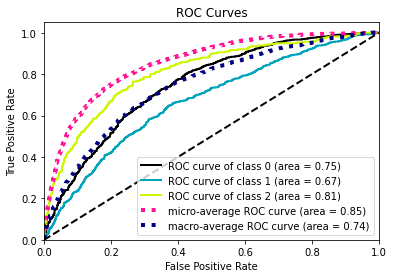

In [62]:
skplt.metrics.plot_roc(y_test.tolist(), y_pred)

### CatBoost

In [63]:
df[nominal_cols + ordinal_cols + numeric_cols]

,RIAGENDR,RIDRETH3,DMDBORN4,DMDMARTZ,RIDEXPRG,SIALANG,SIAPROXY,SIAINTRP,HUQ030,HUQ071,HUQ090,HIQ011,HIQ032A,HIQ032B,HIQ032C,HIQ032D,HIQ032E,HIQ032H,HIQ032I,HIQ270,HIQ210,DMDYRUSZ,DMDEDUC2,HUQ010,RIDAGEYR,RIDAGEMN,INDFMPIR
0,0,6,0,4,4,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,2,5,6,1,2,24,4.66
1,1,1,0,4,4,0,1,0,1,0,1,1,1,0,0,0,0,1,0,1,2,5,6,2,13,156,0.83
2,0,3,0,4,4,0,1,0,1,0,0,1,0,0,0,1,0,0,0,1,2,5,6,1,2,24,3.06
3,1,6,1,3,2,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,2,2,5,3,29,348,5.00
4,1,2,1,3,3,0,0,0,2,0,0,1,0,0,0,0,0,0,0,1,2,3,4,1,21,252,5.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15393,0,4,0,1,4,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,2,5,5,2,40,480,3.82
15394,0,4,0,4,4,0,1,0,1,0,0,1,1,0,0,1,0,0,0,1,2,5,6,3,2,24,0.07
15395,1,3,0,4,4,0,1,0,1,0,0,1,1,0,0,1,0,0,0,1,2,5,6,1,7,84,1.22
15396,0,4,0,2,4,0,0,0,1,0,0,0,1,0,0,0,0,0,0,3,3,5,2,3,63,756,3.71


In [64]:
X_train, X_test, y_train, y_test = train_test_split(df[nominal_cols + ordinal_cols + numeric_cols], 
                                                    df[target_col], 
                                                    test_size=0.20
                                                    )

In [65]:
for col in X_train.columns:
    X_train[col] = X_train[col].astype(float)
    
for col in X_test.columns:
    X_test[col] = X_test[col].astype(float)

In [66]:
model = CatBoostClassifier()

In [67]:
grid_vals = {'learning_rate': [0.01, 0.1], 'iterations': [50, 100, 150],
             'loss_function': ['MultiClass', 'MultiClassOneVsAll'],
#                'num_leaves': [6, 12, 16], 
#                'colsample_bylevel': [0.75, 0.8], 
             'logging_level':['Silent'],
#                'subsample': [0.7, 0.8], 
             'l2_leaf_reg': [1e-5, 1e-2],
            'depth'         : [4,5,6],
            "classes_count":[3]}


In [73]:
grid_lr = GridSearchCV(estimator=model, param_grid=grid_vals, scoring='f1_micro', 
                       cv=StratifiedKFold(n_splits=5), refit=True, return_train_score=True, error_score='raise', n_jobs=4) 

In [74]:
# create categorical feature indices for catboost
cat_features = []
for col in nominal_cols + ordinal_cols:
    
    if col == target_col:
        continue
    cat_features.append(X_train.columns.get_loc(col))
    

In [75]:
X_train = X_train.astype(int)

In [76]:
y_train = y_train.astype(int)

In [77]:
grid_lr.fit(X_train, y_train, cat_features=cat_features)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise',
             estimator=<catboost.core.CatBoostClassifier object at 0x7fa3087d1460>,
             n_jobs=4,
             param_grid={'classes_count': [3], 'depth': [4, 5, 6],
                         'iterations': [50, 100, 150],
                         'l2_leaf_reg': [1e-05, 0.01],
                         'learning_rate': [0.01, 0.1],
                         'logging_level': ['Silent'],
                         'loss_function': ['MultiClass', 'MultiClassOneVsAll']},
             return_train_score=True, scoring='f1_micro')

In [78]:
pd.DataFrame(grid_lr.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classes_count,param_depth,param_iterations,param_l2_leaf_reg,param_learning_rate,param_logging_level,param_loss_function,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.579959,0.060378,0.015472,0.008618,3,4,50,0.00001,0.01,Silent,MultiClass,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.677917,0.677917,0.676949,0.677366,0.675281,0.677086,0.000973,65,0.677608,0.681984,0.677433,0.679204,0.677433,0.678732,0.001757
1,0.645658,0.093780,0.030536,0.013413,3,4,50,0.00001,0.01,Silent,MultiClassOneVsAll,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.676667,0.676250,0.676115,0.676949,0.675281,0.676252,0.000569,69,0.676878,0.677087,0.677433,0.678787,0.677641,0.677565,0.000666
2,0.647222,0.053124,0.019700,0.008182,3,4,50,0.00001,0.1,Silent,MultiClass,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.699583,0.688333,0.699041,0.692789,0.703210,0.696591,0.005318,27,0.700010,0.703449,0.700771,0.703063,0.700146,0.701488,0.001471
3,0.599705,0.020488,0.015370,0.003883,3,4,50,0.00001,0.1,Silent,MultiClassOneVsAll,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.697500,0.690417,0.694873,0.694456,0.697791,0.695007,0.002659,35,0.700844,0.702928,0.699208,0.699833,0.696187,0.699800,0.002204
4,0.647734,0.068814,0.026653,0.014490,3,4,50,0.01,0.01,Silent,MultiClass,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.677917,0.677917,0.676949,0.677366,0.675281,0.677086,0.000973,65,0.677608,0.681984,0.677433,0.679204,0.677433,0.678732,0.001757
5,0.609636,0.065213,0.020384,0.007510,3,4,50,0.01,0.01,Silent,MultiClassOneVsAll,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.676667,0.676250,0.676115,0.676949,0.675281,0.676252,0.000569,69,0.676878,0.677087,0.677433,0.678787,0.677641,0.677565,0.000666
6,0.632091,0.062325,0.019572,0.004873,3,4,50,0.01,0.1,Silent,MultiClass,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.699583,0.688333,0.699041,0.692789,0.703210,0.696591,0.005318,27,0.700010,0.703449,0.700875,0.703063,0.700146,0.701509,0.001462
7,0.663201,0.041068,0.021000,0.012165,3,4,50,0.01,0.1,Silent,MultiClassOneVsAll,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.697500,0.690417,0.694873,0.694456,0.697791,0.695007,0.002659,35,0.700844,0.702928,0.699417,0.699833,0.696187,0.699842,0.002194
8,1.181610,0.079134,0.026607,0.008613,3,4,100,0.00001,0.01,Silent,MultiClass,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.680417,0.679167,0.680283,0.677366,0.678199,0.679086,0.001180,61,0.677399,0.683026,0.681600,0.679204,0.679725,0.680191,0.001950
9,1.218267,0.080228,0.024351,0.014529,3,4,100,0.00001,0.01,Silent,MultiClassOneVsAll,"{'classes_count': 3, 'depth': 4, 'iterations':...",0.677500,0.676667,0.675698,0.675281,0.675281,0.676086,0.000870,71,0.676774,0.678754,0.677537,0.678579,0.677433,0.677815,0.000745


In [79]:
grid_lr.best_estimator_

In [80]:
y_pred = grid_lr.predict(X_test.astype(int))
out = pd.DataFrame({"y_pred":y_pred.flatten(), "y_label":y_test})

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

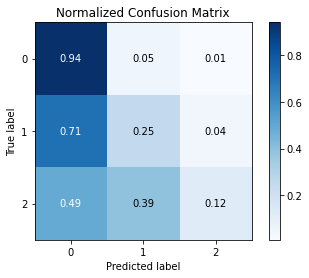

In [81]:
skplt.metrics.plot_confusion_matrix(out["y_label"].tolist(), out["y_pred"].tolist(), normalize=True)

In [82]:
print(classification_report(out["y_label"].tolist(), out["y_pred"].tolist(), target_names=["Low", "Moderate", "High"]))

              precision    recall  f1-score   support

         Low       0.73      0.94      0.82      1971
    Moderate       0.50      0.25      0.34       781
        High       0.39      0.12      0.18       248

    accuracy                           0.69      3000
   macro avg       0.54      0.44      0.45      3000
weighted avg       0.64      0.69      0.64      3000



In [83]:
y_pred = grid_lr.predict_proba(X_test.astype(int))

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

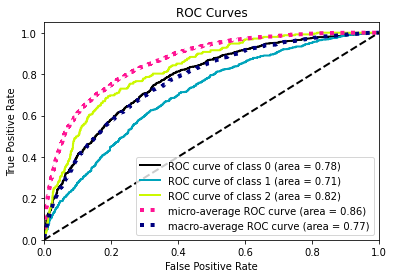

In [84]:
skplt.metrics.plot_roc(y_test.tolist(), y_pred)

Text(0, 0.5, 'Features')

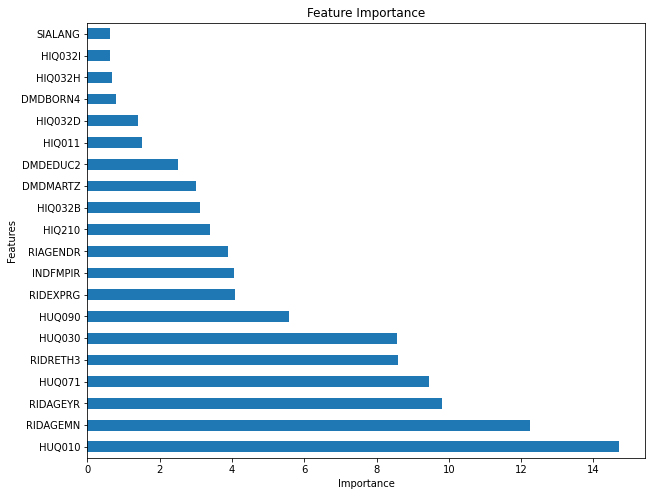

In [85]:
feat_importances = pd.Series(grid_lr.best_estimator_.feature_importances_, index=X_train.columns)
feat_importances.nlargest(20).plot(kind='barh', figsize=(10,8))
plt.title("Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Features")